<a href="https://colab.research.google.com/github/MatiasMarro/Deep-Learning/blob/main/clip_image_retrieval_sentence_transformers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sentence-Transformers + CLIP: búsqueda texto↔imagen, clustering y zero-shot (tutorial reproducible)

Este notebook está pensado para **publicarse en GitHub** y para que cualquiera pueda entenderlo aunque sea principiante/intermedio.

Usamos **Sentence-Transformers** con modelos **CLIP** para:

1. **Text → Image retrieval** (buscar imágenes con texto).
2. **Búsqueda multilingüe** (texto en ES/PT/EN).
3. **Clustering no supervisado** de imágenes.
4. **Detección de duplicados / casi duplicados**.
5. **Zero-shot image classification** (clasificar sin entrenar, solo con etiquetas en texto).

> Dataset demo: *Unsplash-25k-photos* (se descarga automáticamente).  
> **Tu dataset estilo CLIP** (imagen + caption) también lo podés enchufar: al final dejo un bloque para adaptarlo.

---

## Requisitos
- Python 3.9+
- GPU opcional (acelera el encode, pero funciona en CPU)


In [1]:
# =========================
# 1) Instalación (una vez)
# =========================

# Instalamos Sentence-Transformers (incluye integración con PyTorch/Transformers).
%pip -q install sentence_transformers

# Librerías auxiliares (imágenes, plots, barra de progreso).
%pip -q install pillow matplotlib tqdm


In [2]:
# =========================
# 2) Imports y configuración
# =========================

from __future__ import annotations  # Permite anotaciones de tipos más limpias (Python 3.9+)

from pathlib import Path  # Paths multiplataforma y más seguros que strings
import os  # Variables de entorno y utilidades del sistema operativo
import random  # Reproducibilidad (shuffle/seed)
import json  # Guardar / cargar metadata (ej. paths)
import math  # Operaciones matemáticas básicas (por si lo necesitás)
import zipfile  # Extraer ZIPs de datasets
import urllib.request  # Descargar archivos vía HTTP sin depender de wget
from typing import Iterable, List, Tuple  # Tipos para documentar funciones

import torch  # Tensores, GPU, guardar/cargar embeddings
from PIL import Image  # Cargar imágenes desde disco (Pillow)
import matplotlib.pyplot as plt  # Visualización
from tqdm.auto import tqdm  # Barra de progreso

from sentence_transformers import SentenceTransformer, util  # Modelos y utilidades (cos_sim, semantic_search, etc.)

# (Opcional) Si estás en notebooks, esto mejora la visualización de plots.
%matplotlib inline

# -------------------------
# Reproducibilidad
# -------------------------
SEED: int = 42  # Semilla fija para que shuffles/aleatoriedad sean repetibles

random.seed(SEED)  # Seed del módulo random
torch.manual_seed(SEED)  # Seed de PyTorch (CPU)
torch.cuda.manual_seed_all(SEED)  # Seed de PyTorch (GPU, si hay)

# -------------------------
# Dispositivo (CPU / GPU)
# -------------------------
DEVICE: str = "cuda" if torch.cuda.is_available() else "cpu"  # Elegimos GPU si existe

print("✅ Device:", DEVICE)  # Mostramos dónde va a correr el modelo


✅ Device: cuda


## 3) Dataset demo (Unsplash) + estructura para tu dataset estilo CLIP

El dataset demo contiene solo imágenes, ideal para:
- búsqueda texto→imagen,
- clustering,
- duplicados,
- zero-shot con etiquetas.

Si tu dataset es estilo **CLIP** (imagen + caption), lo común es tener:
- un folder con imágenes, y
- un CSV/JSON con columnas tipo: `image_path`, `caption`.

Más abajo dejo un bloque listo para adaptar eso.


In [10]:
# =========================
# 3.1) Descargar y extraer dataset (demo)
# =========================
from pathlib import Path  # Add this line to import Path
DATA_DIR: Path = Path("data")  # Carpeta raíz para datos
DATA_DIR.mkdir(parents=True, exist_ok=True)  # Creamos la carpeta si no existe

UNSPLASH_ZIP_URL: str = (
    "https://public.ukp.informatik.tu-darmstadt.de/reimers/sentence-transformers/"
    "datasets/unsplash-25k-photos.zip"
)  # URL oficial del dataset demo

ZIP_PATH: Path = DATA_DIR / "unsplash-25k-photos.zip"  # Donde guardaremos el ZIP
PHOTOS_DIR: Path = DATA_DIR / "photos"  # Donde quedarán las imágenes extraídas
print(PHOTOS_DIR)

!wget https://public.ukp.informatik.tu-darmstadt.de/reimers/sentence-transformers/datasets/unsplash-25k-photos.zip
!unzip 'unsplash-25k-photos.zip' -d 'data/photos'

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: data/photos/ErnD0oSB9OE.jpg  
  inflating: data/photos/CLMlVwtPsI4.jpg  
  inflating: data/photos/7by0hnrUBP8.jpg  
  inflating: data/photos/XWARm1Wgg4U.jpg  
  inflating: data/photos/m_x26CPIjic.jpg  
  inflating: data/photos/Or9vxPAGtXw.jpg  
  inflating: data/photos/asr62h5w66w.jpg  
  inflating: data/photos/oPubZ53L5OE.jpg  
  inflating: data/photos/AENmGl9JVgs.jpg  
  inflating: data/photos/kR1Aer8c_WI.jpg  
  inflating: data/photos/YCniL3n_B7Q.jpg  
  inflating: data/photos/pg5CVv0FEBU.jpg  
  inflating: data/photos/jynDaAkI0H8.jpg  
  inflating: data/photos/QP64OlGcfcQ.jpg  
  inflating: data/photos/a_nu2fRoqwI.jpg  
  inflating: data/photos/HeerZLfH4h8.jpg  
  inflating: data/photos/7TGVEgcTKlY.jpg  
  inflating: data/photos/fN2pzLWtG6A.jpg  
  inflating: data/photos/lpxXl5Ssung.jpg  
  inflating: data/photos/yan5Aj6crIU.jpg  
  inflating: data/photos/9Phn7Dwz2PM.jpg  
  inflating: data/photos/9TRaDtl7Z5U

In [11]:
# =========================
# 3.2) Listar imágenes del dataset
# =========================

def list_image_paths(folder: Path, limit: int = 2000) -> List[Path]:
    """Devuelve una lista de paths a imágenes JPG dentro de una carpeta.

    Args:
        folder: Carpeta con imágenes.
        limit: Máximo de imágenes a usar (para que el tutorial sea rápido).

    Returns:
        Lista de Paths a imágenes.
    """
    paths = sorted(folder.glob("*.jpg"))  # Buscamos todos los .jpg ordenados para reproducibilidad
    print("📸 Total de imágenes encontradas:", len(paths))  # Conteo del dataset completo
    return paths[:limit]  # Cortamos a 'limit' para que sea manejable

IMAGE_PATHS: List[Path] = list_image_paths(PHOTOS_DIR, limit=2000)  # Nos quedamos con 2000
print("✅ Usando imágenes:", len(IMAGE_PATHS))  # Confirmación
print("Ejemplo de path:", IMAGE_PATHS[0])  # Mostramos un ejemplo


📸 Total de imágenes encontradas: 24996
✅ Usando imágenes: 2000
Ejemplo de path: data/photos/--2IBUMom1I.jpg


In [12]:
# =========================
# 4) Cargar modelo CLIP (Sentence-Transformers)
# =========================

# Modelo CLIP de OpenAI “ViT-B/32” empaquetado para Sentence-Transformers.
# - Puede encodear TEXTO y también IMÁGENES (PIL.Image) al MISMO espacio vectorial.
MODEL_NAME: str = "clip-ViT-B-32"  # Nombre exacto del modelo (case-sensitive)

model: SentenceTransformer = SentenceTransformer(MODEL_NAME, device=DEVICE)  # Cargamos en CPU/GPU

print("✅ Modelo cargado:", MODEL_NAME)  # Confirmación


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: /root/.cache/huggingface/hub/models--sentence-transformers--clip-ViT-B-32/snapshots/327ab6726d33c0e22f920c83f2ff9e4bd38ca37f/0_CLIPModel
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
The image processor of type `CLIPImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


✅ Modelo cargado: clip-ViT-B-32


In [13]:
# =========================
# 5) Generar embeddings de imágenes (con cache)
# =========================

EMB_CACHE_DIR: Path = DATA_DIR / "embeddings"  # Carpeta para cachear embeddings
EMB_CACHE_DIR.mkdir(parents=True, exist_ok=True)  # Creamos si no existe

IMG_EMB_PATH: Path = EMB_CACHE_DIR / "unsplash_2k_clipvitb32.pt"  # Archivo de embeddings cacheados
IMG_PATHS_JSON: Path = EMB_CACHE_DIR / "unsplash_2k_paths.json"  # Archivo con paths (mismo orden)

def batched(items: List[Path], batch_size: int) -> Iterable[List[Path]]:
    """Divide una lista en batches."""
    for i in range(0, len(items), batch_size):  # Avanzamos de a batch_size
        yield items[i : i + batch_size]  # Devolvemos un segmento (batch)

def encode_images_in_batches(
    model: SentenceTransformer,
    image_paths: List[Path],
    batch_size: int = 32,
) -> torch.Tensor:
    """Encodea imágenes en batches para no abrir 2000 imágenes juntas.

    Nota: para CLIP en Sentence-Transformers, pasamos PIL.Image al .encode().

    Returns:
        Tensor [N, D] con embeddings de imágenes.
    """
    all_embs: List[torch.Tensor] = []  # Acumularemos embeddings por batch

    for batch_paths in tqdm(list(batched(image_paths, batch_size)), desc="encode_images"):  # Iteramos batches
        batch_images: List[Image.Image] = []  # Lista de imágenes PIL del batch

        for p in batch_paths:  # Abrimos cada imagen del batch
            img = Image.open(p).convert("RGB")  # Abrimos y convertimos a RGB (consistente)
            batch_images.append(img)  # Guardamos PIL image

        batch_emb: torch.Tensor = model.encode(  # Encode del batch
            batch_images,  # Inputs: imágenes PIL
            batch_size=len(batch_images),  # Batch ya armado, así que usamos su tamaño
            convert_to_tensor=True,  # Queremos torch.Tensor para hacer cos_sim / semantic_search
            show_progress_bar=False,  # Ya tenemos tqdm externo
        )

        all_embs.append(batch_emb)  # Guardamos embeddings del batch

        for img in batch_images:  # Cerramos handles de archivos (buena práctica)
            img.close()  # Liberamos recursos

    embs: torch.Tensor = torch.cat(all_embs, dim=0)  # Unimos [B,D] + [B,D] → [N,D]
    return embs  # Devolvemos tensor final

# -------------------------
# Cargar cache si existe
# -------------------------
if IMG_EMB_PATH.exists() and IMG_PATHS_JSON.exists():  # Si hay cache completo
    print("✅ Cargando embeddings desde cache...")  # Aviso
    img_embeddings: torch.Tensor = torch.load(IMG_EMB_PATH, map_location="cpu")  # Cargamos en CPU (más portable)
    cached_paths: List[str] = json.loads(IMG_PATHS_JSON.read_text(encoding="utf-8"))  # Leemos lista de paths
    IMAGE_PATHS = [Path(p) for p in cached_paths]  # Reconstruimos Paths en mismo orden
else:
    print("🧠 Generando embeddings (primera vez)...")  # Aviso
    img_embeddings = encode_images_in_batches(model, IMAGE_PATHS, batch_size=32)  # Encode batcheado

    img_embeddings = img_embeddings.cpu()  # Guardamos en CPU para que el cache sea portable
    torch.save(img_embeddings, IMG_EMB_PATH)  # Guardamos embeddings

    IMG_PATHS_JSON.write_text(  # Guardamos paths para asegurar el mismo orden al recargar
        json.dumps([str(p) for p in IMAGE_PATHS], ensure_ascii=False, indent=2),
        encoding="utf-8",
    )

print("✅ Embeddings listos. Shape:", tuple(img_embeddings.shape))  # Ej: (2000, 512)


🧠 Generando embeddings (primera vez)...


encode_images:   0%|          | 0/63 [00:00<?, ?it/s]

✅ Embeddings listos. Shape: (2000, 512)


## 6) Búsqueda **Texto → Imagen** (Retrieval)

**Idea CLIP:**  
- El texto y las imágenes viven en el **mismo espacio vectorial**.  
- Entonces, si convertimos una query a embedding, podemos buscar las imágenes “cercanas” por **cosine similarity**.

### Ejemplo mental (simplificado)
Imaginá que cada imagen es un punto en 3D (en realidad es 512D):
- `"a red car"` cae cerca de imágenes con autos rojos.
- `"dogs with human"` cae cerca de fotos de perros con personas.

`util.semantic_search(query_emb, img_embeddings)` hace exactamente eso: retorna los `top_k` vecinos más cercanos.


Query: dogs with human
Hits (raw): [{'corpus_id': 1011, 'score': 0.2816743552684784}, {'corpus_id': 1072, 'score': 0.280379980802536}, {'corpus_id': 493, 'score': 0.27531909942626953}]
#1 score=0.2817 → data/photos/1c1KEBL1yTg.jpg


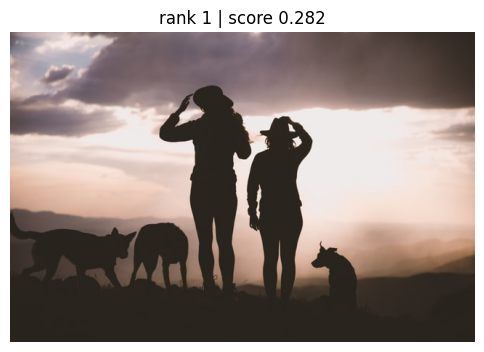

#2 score=0.2804 → data/photos/1mP62BB2xcI.jpg


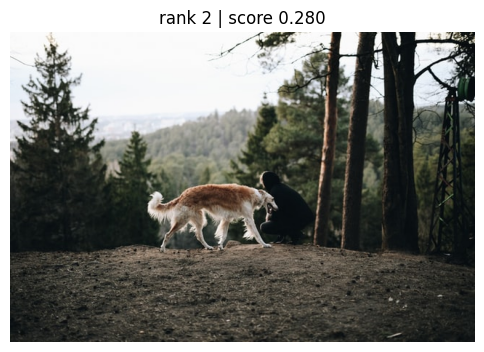

#3 score=0.2753 → data/photos/0EVL1vLA5SM.jpg


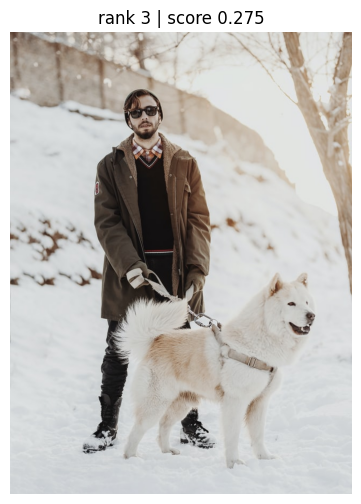

In [14]:
# =========================
# 6.1) Helpers de visualización y búsqueda
# =========================

def show_image(path: Path, title: str | None = None) -> None:
    """Muestra una imagen individual con matplotlib."""
    img = Image.open(path).convert("RGB")  # Abrimos la imagen
    plt.figure(figsize=(6, 6))  # Tamaño fijo para que sea legible
    plt.imshow(img)  # Render
    plt.axis("off")  # Quitamos ejes
    if title is not None:  # Si nos pasaron un título
        plt.title(title)  # Lo mostramos
    plt.show()  # Mostramos la figura
    img.close()  # Cerramos el archivo

def text_to_image_search(
    query: str,
    text_model: SentenceTransformer,
    image_embeddings: torch.Tensor,
    image_paths: List[Path],
    top_k: int = 3,
) -> List[dict]:
    """Busca imágenes relevantes para un texto.

    Returns:
        Lista de hits (dicts) con keys típicas: 'corpus_id' y 'score'.
    """
    query_emb: torch.Tensor = text_model.encode(  # Convertimos el texto a embedding
        [query],  # encode espera lista de strings (aunque sea 1)
        convert_to_tensor=True,  # Queremos torch.Tensor
        show_progress_bar=False,  # Sin barra (es rápido)
    )

    # semantic_search calcula similarity y devuelve los top_k.
    # Internamente usa cosine similarity (util.cos_sim) y retorna lista de dicts.
    hits: List[dict] = util.semantic_search(query_emb, image_embeddings, top_k=top_k)[0]  # Tomamos el primer (y único) query

    return hits  # Devolvemos hits para que el caller decida cómo mostrarlos

# -------------------------
# 6.2) Ejemplo de búsqueda
# -------------------------
query: str = "dogs with human"  # Query en inglés (pero puede ser lo que quieras)

hits = text_to_image_search(  # Ejecutamos búsqueda
    query=query,  # Texto
    text_model=model,  # Modelo CLIP (texto)
    image_embeddings=img_embeddings,  # Embeddings de imágenes
    image_paths=IMAGE_PATHS,  # Paths (mismo orden que embeddings)
    top_k=3,  # Top 3 resultados
)

print("Query:", query)  # Mostramos query
print("Hits (raw):", hits)  # Estructura cruda para entender qué devuelve

for rank, hit in enumerate(hits, start=1):  # Recorremos resultados ordenados
    idx: int = int(hit["corpus_id"])  # Índice del embedding en el "corpus" (nuestra lista de imágenes)
    score: float = float(hit["score"])  # Similaridad (más alto = más cercano)
    path: Path = IMAGE_PATHS[idx]  # Path correspondiente

    print(f"#{rank} score={score:.4f} → {path}")  # Log

    show_image(path, title=f"rank {rank} | score {score:.3f}")  # Mostramos la imagen


## 7) Búsqueda multilingüe (ES/PT/EN) en el mismo espacio CLIP

El modelo `clip-ViT-B-32-multilingual-v1` está entrenado para que:
- **texto en varios idiomas** caiga en el mismo espacio que **las imágenes CLIP**.

Estrategia:
1. Embeddings de imágenes: con `clip-ViT-B-32`.
2. Embedding del texto: con `clip-ViT-B-32-multilingual-v1`.
3. `semantic_search`: igual que antes.


modules.json:   0%|          | 0.00/341 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/572 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/539M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/371 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/115 [00:00<?, ?B/s]

2_Dense/model.safetensors:   0%|          | 0.00/1.57M [00:00<?, ?B/s]

✅ Modelo multilingüe cargado: clip-ViT-B-32-multilingual-v1

Query: persona
#1 score=0.2546 → data/photos/0QkyEoTQ6Pc.jpg


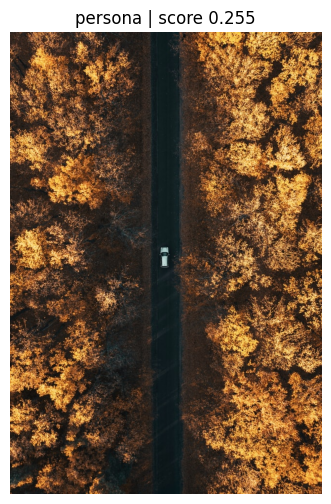

#2 score=0.2536 → data/photos/-nVrF2DL2Jo.jpg


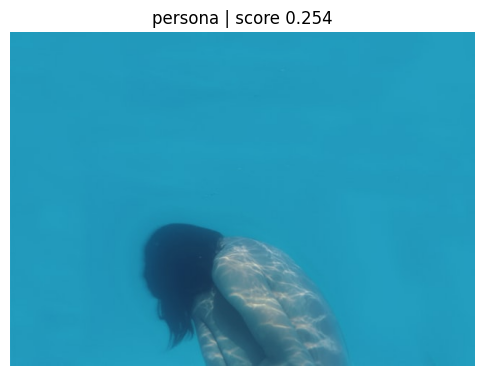


Query: um cachorro com uma pessoa
#1 score=0.2858 → data/photos/3yjqMQC_vBI.jpg


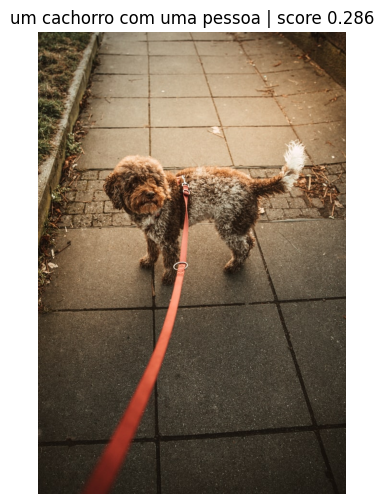

#2 score=0.2797 → data/photos/1mP62BB2xcI.jpg


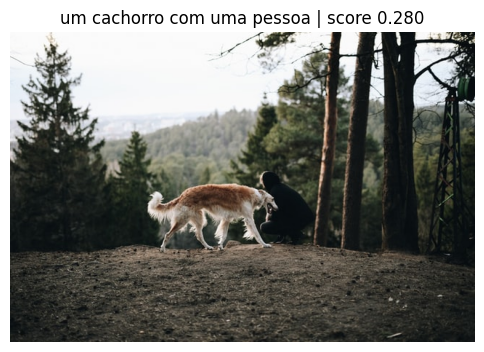


Query: a dog with a human
#1 score=0.2796 → data/photos/3yjqMQC_vBI.jpg


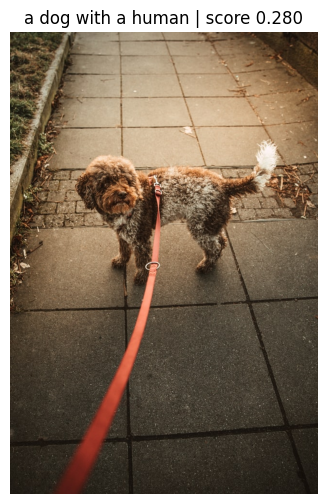

#2 score=0.2750 → data/photos/099M7jfu7CY.jpg


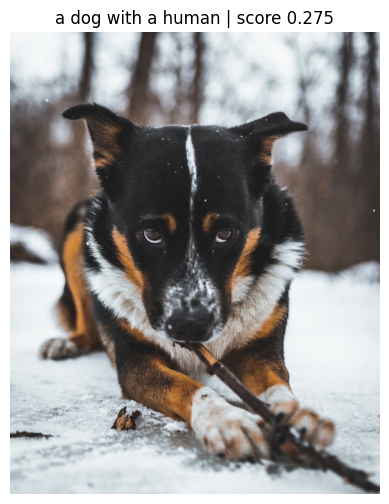

In [15]:
# =========================
# 7.1) Modelo multilingüe (solo para el TEXTO)
# =========================

MULTILINGUAL_TEXT_MODEL_NAME: str = "clip-ViT-B-32-multilingual-v1"  # Modelo multilingüe

text_model_multi: SentenceTransformer = SentenceTransformer(  # Cargamos el modelo
    MULTILINGUAL_TEXT_MODEL_NAME,  # Nombre
    device=DEVICE,  # CPU/GPU
)

print("✅ Modelo multilingüe cargado:", MULTILINGUAL_TEXT_MODEL_NAME)  # Confirmación

# -------------------------
# 7.2) Búsquedas en distintos idiomas
# -------------------------
queries = [  # Lista de queries para probar
    "persona",  # Español
    "um cachorro com uma pessoa",  # Portugués
    "a dog with a human",  # Inglés
]

for q in queries:  # Iteramos queries
    hits = text_to_image_search(  # Buscamos
        query=q,  # Texto
        text_model=text_model_multi,  # Modelo multilingüe
        image_embeddings=img_embeddings,  # Mismos embeddings de imágenes
        image_paths=IMAGE_PATHS,  # Paths
        top_k=2,  # Top 2 para no spamear
    )

    print("\n======================")  # Separador
    print("Query:", q)  # Query actual

    for rank, hit in enumerate(hits, start=1):  # Recorremos resultados
        idx = int(hit["corpus_id"])  # Índice en corpus
        score = float(hit["score"])  # Similaridad
        path = IMAGE_PATHS[idx]  # Path de imagen
        print(f"#{rank} score={score:.4f} → {path}")  # Log
        show_image(path, title=f"{q} | score {score:.3f}")  # Mostramos imagen


## 8) Clustering no supervisado de imágenes (community detection)

Queremos agrupar imágenes visualmente parecidas **sin labels**.

### Qué hacemos
1. Calculamos similitud coseno entre embeddings.
2. Detectamos “comunidades” = grupos donde muchos elementos están por encima de un `threshold` (ej 0.8).

⚠️ Importante:
- Esto puede ser **O(N²)** si calculás todas las similitudes (para N=2000 ok; para 100k no).
- Para datasets grandes conviene aproximación (FAISS, HNSW, etc.).


✅ Usando util.community_detection
Cantidad de comunidades/clusters: 84

Cluster #1 | size=558


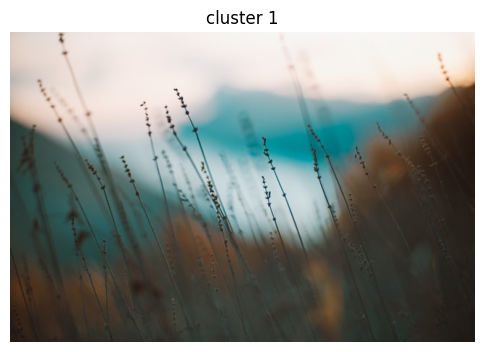

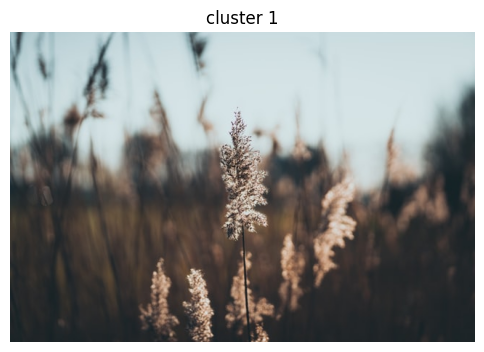

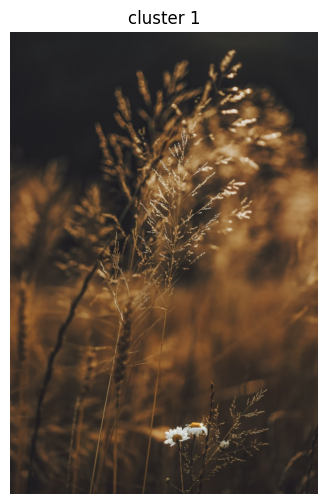


Cluster #2 | size=133


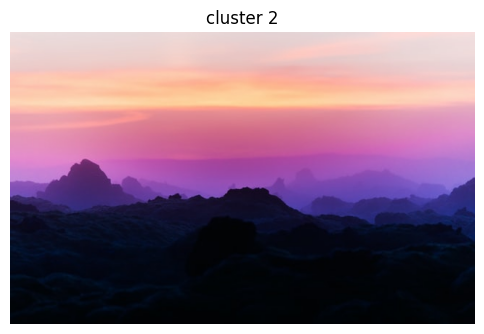

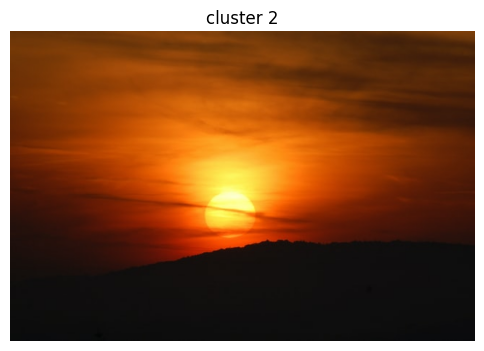

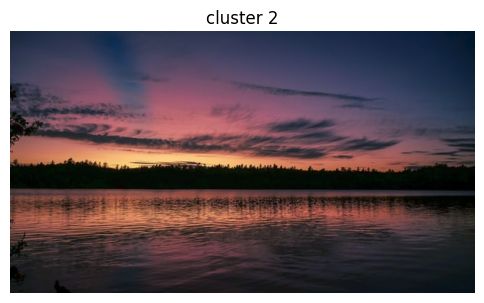


Cluster #3 | size=68


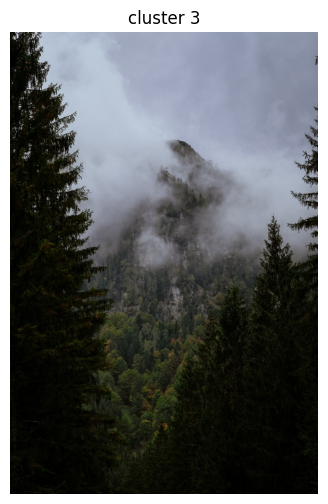

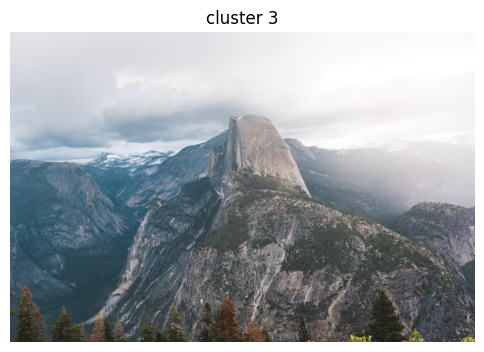

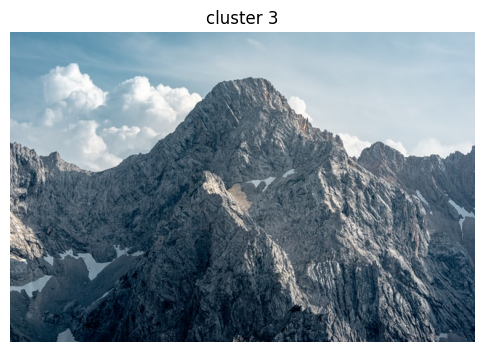

In [17]:
# =========================
# 8.1) Clustering / comunidades
# =========================

threshold: float = 0.80  # Qué tan similares deben ser (cosine similarity)
min_community_size: int = 5  # Tamaño mínimo para considerar un cluster "real"

# Sentence-Transformers trae un helper util.community_detection en muchas versiones.
# Por compatibilidad, lo intentamos usar; si no existe, hacemos fallback a un método manual.
def manual_community_detection(
    embeddings: torch.Tensor,
    threshold: float,
    min_community_size: int,
    init_max_size: int = 1000,
) -> List[List[int]]:
    """Implementación manual (similar a ejemplos clásicos de SBERT).

    Devuelve:
        Lista de clusters, cada cluster es una lista de índices.
    """
    cos_scores = util.cos_sim(embeddings, embeddings)  # Matriz [N,N] con cosine similarity
    top_k_values, _ = cos_scores.topk(k=min_community_size, largest=True)  # Top-k por fila

    extracted_communities: List[List[int]] = []  # Guardaremos clusters candidatos

    for i in range(len(top_k_values)):  # Recorremos cada embedding como "centro"
        if top_k_values[i][-1] >= threshold:  # Si el k-ésimo vecino todavía supera el threshold
            new_cluster: List[int] = []  # Cluster para este centro

            top_val_large, top_idx_large = cos_scores[i].topk(k=init_max_size, largest=True)  # Vecinos más cercanos
            top_idx_large = top_idx_large.tolist()  # Tensor → lista
            top_val_large = top_val_large.tolist()  # Tensor → lista

            if top_val_large[-1] < threshold:  # Caso típico: eventualmente cae debajo del threshold
                for idx, val in zip(top_idx_large, top_val_large):  # Recorremos vecinos ordenados
                    if val < threshold:  # Cuando baja del threshold, cortamos
                        break
                    new_cluster.append(idx)  # Agregamos idx al cluster
            else:
                # Caso raro: incluso el último de init_max_size sigue >= threshold (hay muchos muy parecidos)
                for idx, val in enumerate(cos_scores[i].tolist()):  # Recorremos toda la fila
                    if val >= threshold:  # Si supera threshold
                        new_cluster.append(idx)  # Lo agregamos

            extracted_communities.append(new_cluster)  # Guardamos cluster candidato

    extracted_communities = sorted(extracted_communities, key=len, reverse=True)  # Más grandes primero

    # Filtrado para quedarnos con clusters únicos (sin solapamiento fuerte)
    unique_communities: List[List[int]] = []  # Resultado final
    extracted_ids: set[int] = set()  # Índices ya asignados

    for community in extracted_communities:  # Recorremos clusters candidatos
        add_cluster = True  # Flag para decidir si lo agregamos
        for idx in community:  # Vemos si hay solapamiento
            if idx in extracted_ids:  # Si ya está en otro cluster
                add_cluster = False  # No lo agregamos
                break  # Cortamos

        if add_cluster:  # Si pasó el filtro
            unique_communities.append(community)  # Guardamos cluster
            for idx in community:  # Marcamos ids como usados
                extracted_ids.add(idx)

    return unique_communities  # Clusters sin solapamiento

# Intentamos usar util.community_detection si está disponible
try:
    communities: List[List[int]] = util.community_detection(  # type: ignore[attr-defined]
        img_embeddings,  # Embeddings de imágenes
        threshold=threshold,  # Umbral de similitud
        min_community_size=min_community_size,  # Tamaño mínimo
    )
    print("✅ Usando util.community_detection")  # Aviso
except Exception as e:
    print("⚠️ util.community_detection no disponible o falló. Fallback manual. Error:", repr(e))  # Log
    communities = manual_community_detection(  # Fallback
        embeddings=img_embeddings,  # Embeddings
        threshold=threshold,  # Umbral
        min_community_size=min_community_size,  # Tamaño mínimo
    )

print("Cantidad de comunidades/clusters:", len(communities))  # Conteo

# -------------------------
# 8.2) Visualizar algunos clusters
# -------------------------
for cluster_id, cluster in enumerate(communities[:3], start=1):  # Tomamos los primeros 10 clusters
    print(f"\nCluster #{cluster_id} | size={len(cluster)}")  # Info del cluster

    # Mostramos hasta 3 imágenes de ejemplo del cluster
    for idx in cluster[:3]:  # Primeros 3 índices
        path = IMAGE_PATHS[idx]  # Path de la imagen
        show_image(path, title=f"cluster {cluster_id}")  # Mostramos


## 9) Duplicados y casi duplicados

`util.paraphrase_mining_embeddings` busca pares con alta similitud.

En texto se usa para frases duplicadas; con CLIP funciona para **imágenes** porque también son embeddings en el mismo espacio.

⚠️ Costo: puede ser caro en datasets grandes (comparaciones masivas).


Score: 1.00	Image A: data/photos/0UtMDLOk0Vg.jpg	Image B: data/photos/10OY7Od4YeQ.jpg


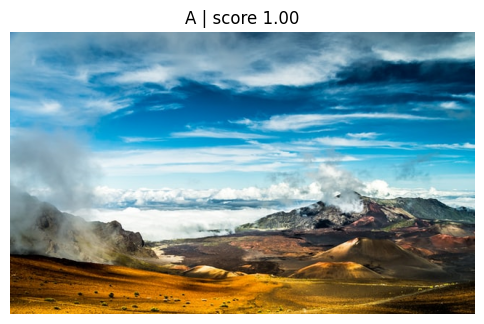

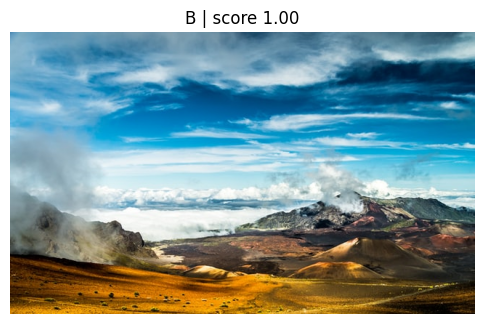

------------------------------------------------------------
Score: 0.98	Image A: data/photos/1z3P4ZI1A6o.jpg	Image B: data/photos/3ACpcGixh2k.jpg


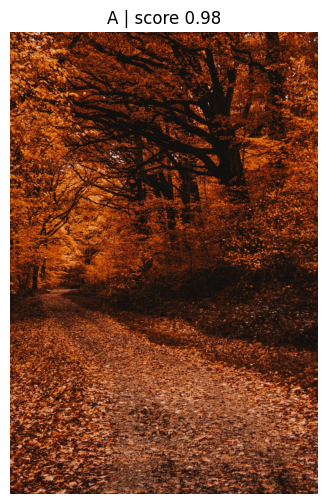

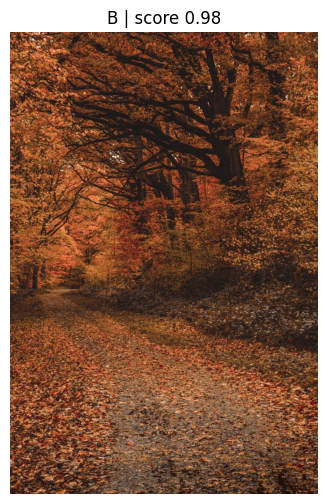

------------------------------------------------------------
Score: 0.98	Image A: data/photos/-MyeEccQNxE.jpg	Image B: data/photos/3nvTdZph18o.jpg


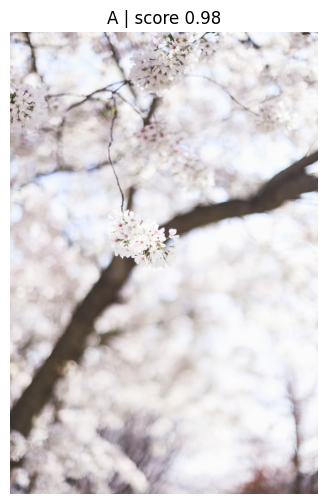

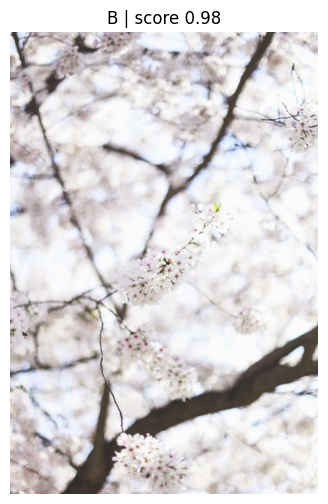

------------------------------------------------------------
Score: 0.97	Image A: data/photos/1z3P4ZI1A6o.jpg	Image B: data/photos/229sPpmo-ow.jpg


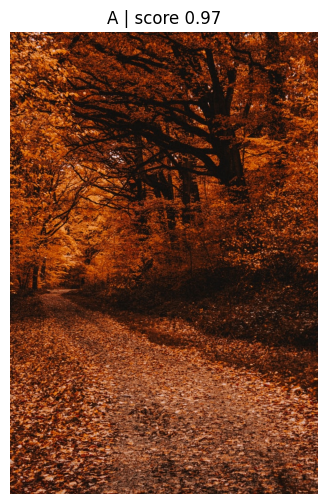

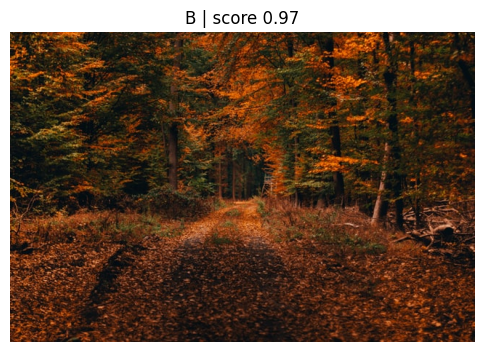

------------------------------------------------------------
Score: 0.97	Image A: data/photos/18Ln684OEj4.jpg	Image B: data/photos/3FVeCbX6OrY.jpg


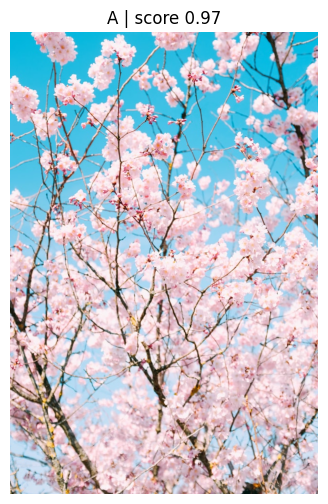

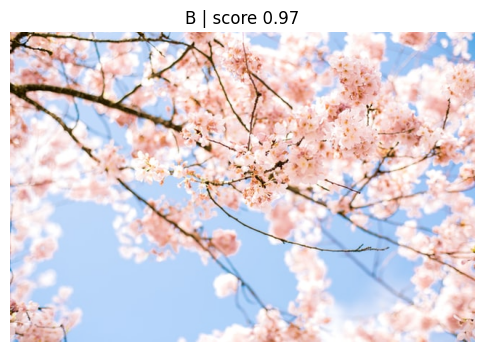

------------------------------------------------------------
Score: 0.97	Image A: data/photos/2BTgB4I4eSM.jpg	Image B: data/photos/3Y4aifH6Als.jpg


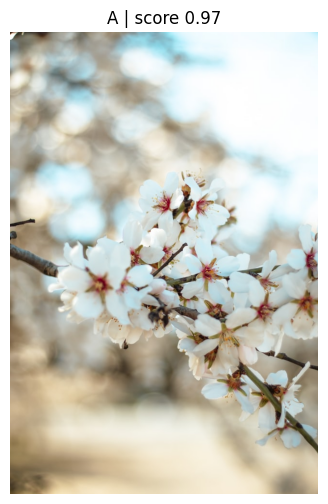

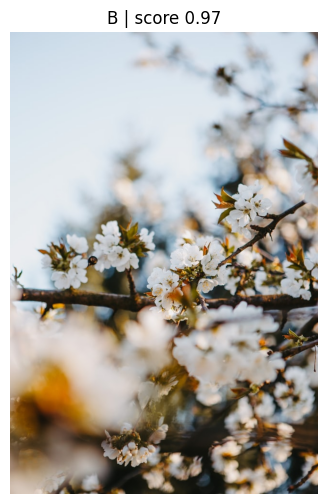

------------------------------------------------------------
Score: 0.97	Image A: data/photos/0-dy5lOmnMs.jpg	Image B: data/photos/3pnKzEQGOXc.jpg


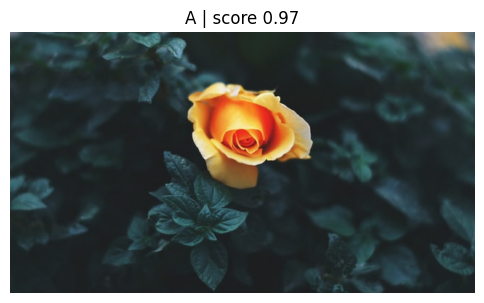

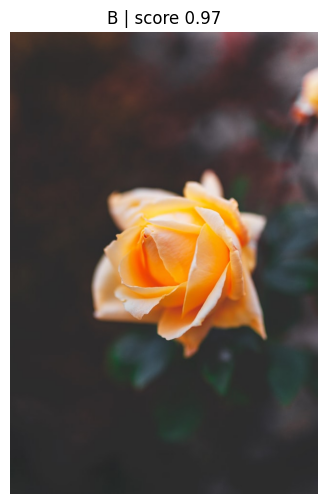

------------------------------------------------------------
Score: 0.97	Image A: data/photos/-N_UwPdUs7E.jpg	Image B: data/photos/-rSka4Bw-EU.jpg


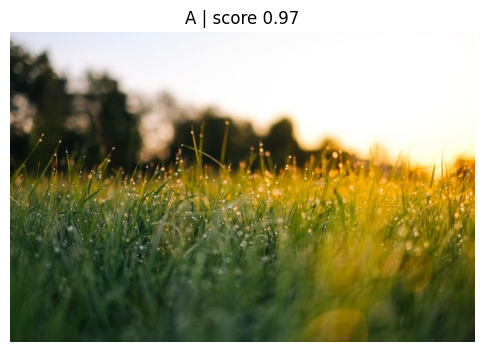

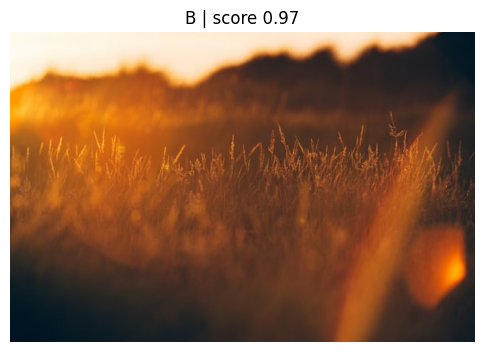

------------------------------------------------------------
Score: 0.97	Image A: data/photos/-9SsJ2jHnkg.jpg	Image B: data/photos/2vnWl27Xiso.jpg


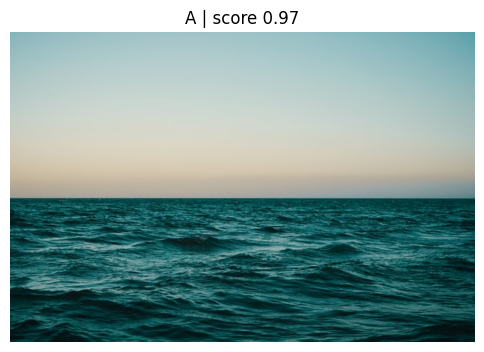

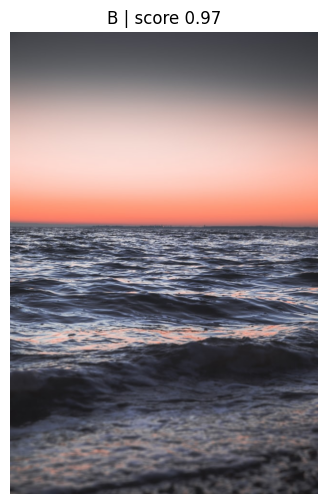

------------------------------------------------------------
Score: 0.97	Image A: data/photos/-96qBKyFefQ.jpg	Image B: data/photos/1zgunBAfJEQ.jpg


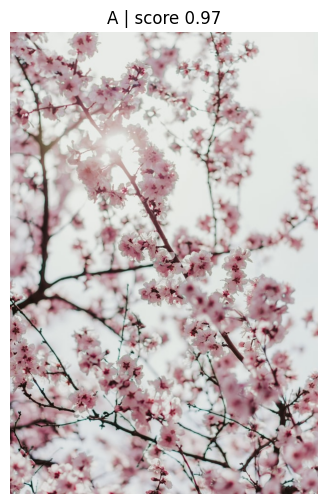

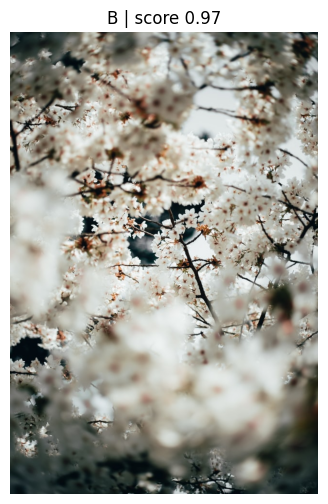

------------------------------------------------------------


In [18]:
# =========================
# 9.1) Minería de duplicados (pares similares)
# =========================

# Buscamos pares de imágenes similares (top_k por cada elemento).
# Devuelve tuplas (score, i, j) donde:
# - i y j son índices en IMAGE_PATHS
# - score es la similitud (aprox cosine similarity)
duplicates = util.paraphrase_mining_embeddings(  # Minería de pares similares
    img_embeddings,  # Embeddings del corpus
    top_k=5,  # Para cada imagen, cuántos pares candidatos consideramos
)

# Mostramos los primeros 10 pares más similares
for score, i, j in duplicates[:10]:  # Iteramos los top 10
    print(f"Score: {score:.2f}\tImage A: {IMAGE_PATHS[i]}\tImage B: {IMAGE_PATHS[j]}")  # Log

    show_image(IMAGE_PATHS[i], title=f"A | score {score:.2f}")  # Imagen A
    show_image(IMAGE_PATHS[j], title=f"B | score {score:.2f}")  # Imagen B

    print("-" * 60)  # Separador


## 10) Zero-shot image classification (sin entrenar)

La idea:
1. Encodeamos imágenes → `img_emb` (CLIP).
2. Encodeamos etiquetas (texto) → `label_emb` (CLIP).
3. Calculamos similitud `cos_sim(img_emb, label_emb)`.
4. Elegimos la etiqueta con mayor score.

Esto es *zero-shot* porque **no entrenamos** un clasificador: solo usamos el espacio semántico de CLIP.


✅ Muestras: 400


encode_zero_shot_images:   0%|          | 0/13 [00:00<?, ?it/s]

Embeddings imágenes: (400, 512)
Embeddings labels: (2, 512)
✅ Zero-shot accuracy (demo): 0.993


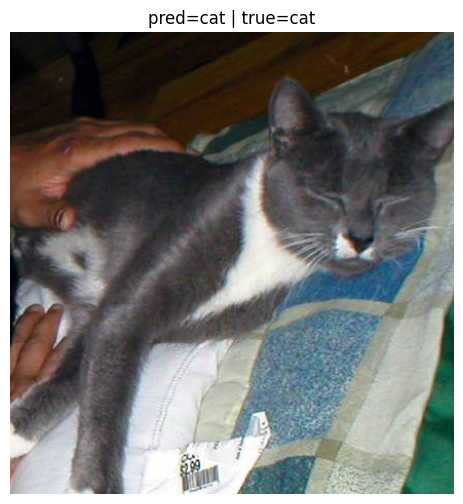

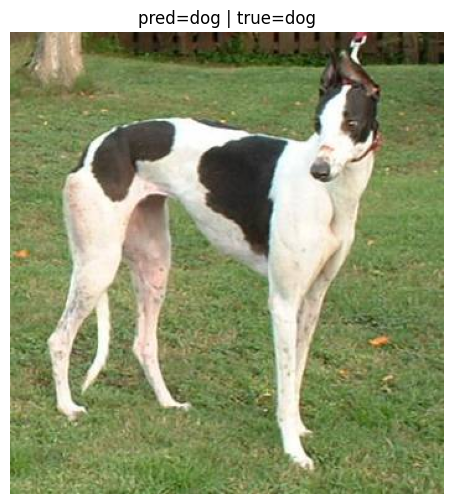

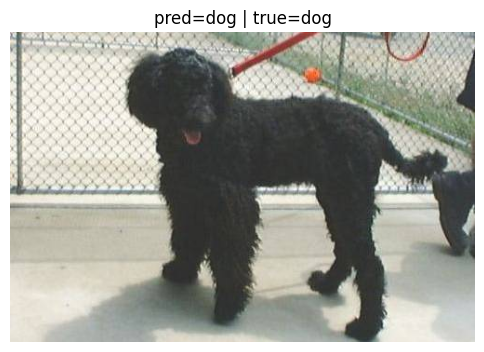

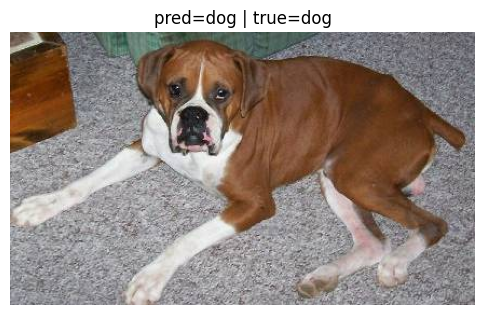

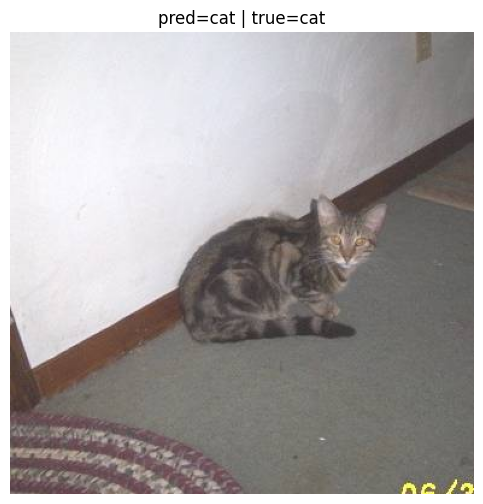

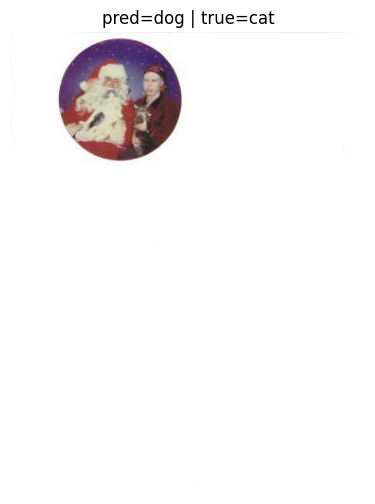

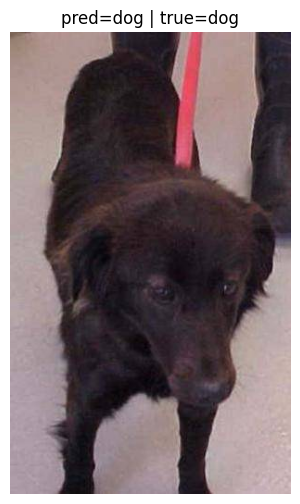

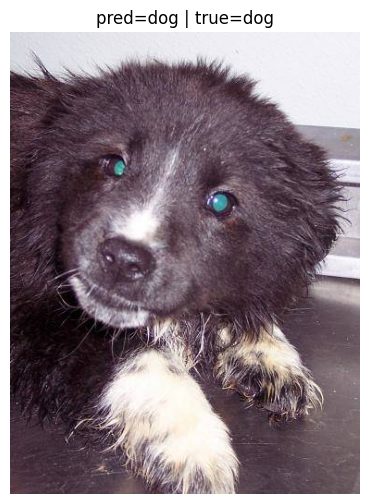

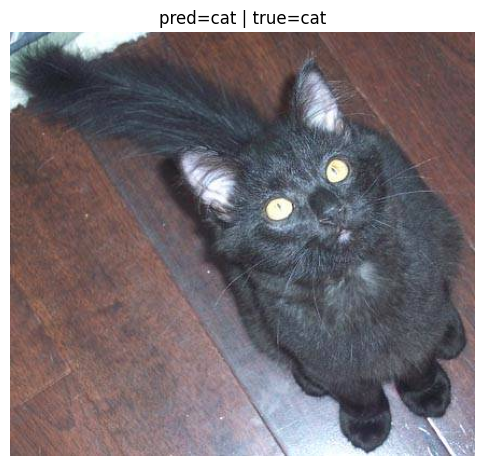

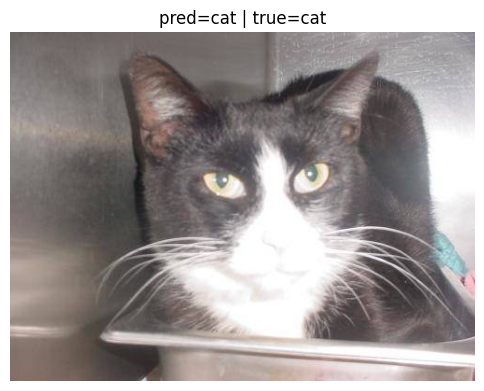

In [19]:
# =========================
# 10.1) Dataset simple dog vs cat (demo)
# =========================

# Clonamos un dataset público (200 dogs + 200 cats aprox para demo).
# En un repo real, ideal es documentar el origen del dataset en el README.
import subprocess  # Ejecutar comandos del sistema desde Python (más portable que !git)

DOGCAT_DIR: Path = DATA_DIR / "dog-cat-full-dataset"  # Donde quedará el repo clonado

if not DOGCAT_DIR.exists():  # Si no existe, clonamos
    subprocess.run(  # Ejecutamos git clone
        ["git", "clone", "https://github.com/laxmimerit/dog-cat-full-dataset.git", str(DOGCAT_DIR)],
        check=True,  # Si falla, lanza error
    )

dog_paths = sorted((DOGCAT_DIR / "data/train/dogs").glob("*.jpg"))[:200]  # Tomamos 200 dogs
cat_paths = sorted((DOGCAT_DIR / "data/train/cats").glob("*.jpg"))[:200]  # Tomamos 200 cats

# Armamos un dataset con labels reales para medir accuracy
samples: List[Tuple[Path, str]] = []  # Lista de (image_path, true_label)
samples += [(p, "dog") for p in dog_paths]  # Dogs
samples += [(p, "cat") for p in cat_paths]  # Cats

random.shuffle(samples)  # Mezclamos para que no estén agrupadas

# Separamos paths y labels reales
zs_image_paths: List[Path] = [p for p, _ in samples]  # Paths
true_labels: List[str] = [lbl for _, lbl in samples]  # Labels reales

print("✅ Muestras:", len(zs_image_paths))  # Confirmación

# =========================
# 10.2) Encode de imágenes (batch) + encode de labels
# =========================

labels: List[str] = ["dog", "cat"]  # Labels candidatas (texto)

# Encodeamos imágenes para zero-shot (reutilizamos helper batched)
zs_img_embs_list: List[torch.Tensor] = []  # Acumularemos embeddings

for batch_paths in tqdm(list(batched(zs_image_paths, 32)), desc="encode_zero_shot_images"):  # Batches de 32
    batch_images: List[Image.Image] = []  # PIL images

    for p in batch_paths:  # Abrimos imágenes
        img = Image.open(p).convert("RGB")  # Abrimos en RGB
        batch_images.append(img)  # Guardamos

    batch_emb = model.encode(  # Encode batch con CLIP
        batch_images,  # Imágenes
        batch_size=len(batch_images),  # Tamaño del batch actual
        convert_to_tensor=True,  # Tensor para cos_sim
        show_progress_bar=False,  # tqdm externo
    )

    zs_img_embs_list.append(batch_emb)  # Guardamos embeddings del batch

    for img in batch_images:  # Cerramos imágenes
        img.close()  # Liberamos recursos

zs_img_emb: torch.Tensor = torch.cat(zs_img_embs_list, dim=0)  # Unimos a [N, D]

# Encodeamos labels (texto) al mismo espacio
label_emb: torch.Tensor = model.encode(labels, convert_to_tensor=True, show_progress_bar=False)  # [C, D]

print("Embeddings imágenes:", tuple(zs_img_emb.shape))  # (N, D)
print("Embeddings labels:", tuple(label_emb.shape))  # (C, D)

# =========================
# 10.3) Similaridad y predicción
# =========================

cos_scores: torch.Tensor = util.cos_sim(zs_img_emb, label_emb)  # [N, C] con cosine similarity
pred_idx: torch.Tensor = torch.argmax(cos_scores, dim=1)  # Índice de label con score máximo por imagen

pred_labels: List[str] = [labels[int(i)] for i in pred_idx]  # Convertimos índices a strings

# Accuracy simple (solo para demo)
correct: int = sum(int(p == t) for p, t in zip(pred_labels, true_labels))  # Conteo correctas
acc: float = correct / len(true_labels)  # Accuracy

print(f"✅ Zero-shot accuracy (demo): {acc:.3f}")  # Resultado

# Mostramos algunas predicciones
for i in range(10):  # Primeras 10
    path = zs_image_paths[i]  # Path
    pred = pred_labels[i]  # Predicción
    truth = true_labels[i]  # Real
    show_image(path, title=f"pred={pred} | true={truth}")  # Visualización


## 11) Adaptar este notebook a **tu dataset CLIP** (imagen + caption)

Si tenés un CSV/JSON con algo así:

| image_path | caption |
|-----------|---------|
| images/0001.jpg | "A dog running on the beach" |
| images/0002.jpg | "A red car in the city" |

Podés usar exactamente el mismo enfoque para:
- **Text→Image retrieval** con captions,
- o incluso preparar el dataset para **fine-tuning** (si querés entrenar).

Debajo hay un “template” para cargar tu tabla.


In [20]:
# =========================
# 11.1) Template loader para dataset CLIP-style (imagen + caption)
# =========================

# 👇 Pegá acá la ruta a tu CSV/JSON y tu carpeta de imágenes.
# Ejemplo:
#   MY_DATA_CSV = Path("data/my_dataset.csv")
#   IMAGES_ROOT = Path("data/images")

from dataclasses import dataclass  # Estructura simple para ejemplos

@dataclass
class ClipSample:
    """Un sample típico CLIP-style: imagen + texto."""
    image_path: Path  # Path a la imagen
    caption: str  # Texto/caption asociado

def load_clip_dataset_from_csv(csv_path: Path, images_root: Path | None = None) -> List[ClipSample]:
    """Carga un CSV con columnas: image_path, caption.

    Args:
        csv_path: Ruta al CSV.
        images_root: Si los paths del CSV son relativos, se resuelven desde acá.

    Returns:
        Lista de ClipSample.
    """
    import csv  # CSV reader estándar

    samples: List[ClipSample] = []  # Acumulador

    with open(csv_path, "r", encoding="utf-8") as f:  # Abrimos el CSV
        reader = csv.DictReader(f)  # Leemos como dict por fila
        for row in reader:  # Iteramos filas
            rel_path = Path(row["image_path"])  # Path relativo o absoluto
            image_path = (images_root / rel_path) if images_root is not None else rel_path  # Resolvemos raíz si aplica
            caption = row["caption"]  # Caption/texto

            samples.append(ClipSample(image_path=image_path, caption=caption))  # Guardamos sample

    return samples  # Devolvemos lista

# -------------------------
# Ejemplo de uso (comentado)
# -------------------------
# my_samples = load_clip_dataset_from_csv(MY_DATA_CSV, images_root=IMAGES_ROOT)
# print("Samples:", len(my_samples))
# print("Ejemplo:", my_samples[0])

# Una vez cargado, podés:
# - Encodear TODAS las imágenes para armar un índice (como hicimos con Unsplash).
# - O encodear captions y construir búsqueda texto↔caption.
# - Si tu objetivo es retrieval texto→imagen, lo más común es:
#     1) img_embeddings = encode_images_in_batches(model, [s.image_path for s in my_samples], ...)
#     2) hits = text_to_image_search(query, model, img_embeddings, ...)
